Universidade do Vale do Itajaí<br>
PPGCA - Programa de Pós-Graduação em Computação Aplicada<br>
Aprendizado Profundo<br>
Prof. Felipe Viel<br>
Conteúdo: Redes Neurais Convolucionais<br>


# Exercício 8: Redes Convolucionais

Neste exercício você irá utilizar redes convolucionais para reconhecimento de imagens. Além de treinar uma rede a partir do zero, você irá investigar a técnica de ajuste fino (*fine tuning*) a partir de uma rede pré-treinada (*transfer learning*).


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import sys
import os
import zipfile
import tarfile
import pickle

print('Python version:', sys.version.split(' ')[0])

import tensorflow as tf
print('TensorFlow version:', tf.__version__)

print("Dispositivos disponíveis:")
print(tf.config.list_physical_devices())

Python version: 3.13.15
TensorFlow version: 2.20.0
Dispositivos disponíveis:
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
def plots(history):
  plt.figure(figsize=(14,4))
  plt.subplot(1,2,1)
  plt.plot(history.history['loss'], '.-', label='Train loss')
  if 'val_loss' in history.history.keys():
    plt.plot(history.history['val_loss'], '.-', label='Val loss')
  plt.xlabel('Epochs');
  plt.legend();
  plt.grid();
  plt.subplot(1,2,2)
  plt.plot(history.history['accuracy'], '.-', label='Train accuracy')
  plt.xlabel('Epochs');
  if 'val_accuracy' in history.history.keys():
    plt.plot(history.history['val_accuracy'], '.-', label='Val accuracy')
  plt.legend();
  plt.grid();

# 1. Treinando a partir do zero

## MNIST

1. Assim como no exercício anterior, carregue o conjunto MNIST e separe as últimas 5000 imagens como conjunto de validação. No entanto, desta vez não realize qualquer pré-processamento nas imagens (como escalonamento); isto será feito [internamente no modelo](https://keras.io/guides/preprocessing_layers/#preprocessing-data-before-the-model-or-inside-the-model) depois.

In [ ]:
from tensorflow.keras.datasets import mnist

(x_train, y_train), (x_test, y_test) = mnist.load_data()

print("x_train:", x_train.shape, x_train.dtype)
print("y_train:", y_train.shape, y_train.dtype)
print("x_test :", x_test.shape, x_test.dtype)
print("y_test :", y_test.shape, y_test.dtype)

x_train: (60000, 28, 28) uint8
y_train: (60000,) uint8
x_test : (10000, 28, 28) uint8
y_test : (10000,) uint8


In [ ]:
# Separação: 55.000 imagens para treinamento e 5.000 para validação
x_val = x_train[55000:]
y_val = y_train[55000:]

x_train = x_train[:55000]
y_train = y_train[:55000]

print("Train shapes:", x_train.shape, y_train.shape)
print("Val shapes  :", x_val.shape, y_val.shape)
print("Test shapes :", x_test.shape, y_test.shape)

Train shapes: (55000, 28, 28) (55000,)
Val shapes  : (5000, 28, 28) (5000,)
Test shapes : (10000, 28, 28) (10000,)


2. Usando o Keras, construa uma rede neural com pelo menos uma camada convolucional (`tf.keras.layers.Conv2D`) e confirme que não há nenhum erro de definição. Organize seu código em uma função de criação do modelo, conforme o exemplo abaixo (dê o nome que preferir). Utilize camadas de escalonamento e *reshape* conforme necessário.

#### Dicas
- Funções úteis: `tf.keras.layers.experimental.preprocessing.Rescaling`, `tf.keras.layers.Reshape`
- Camadas convolucionais 2D exigem que a entrada seja um tensor 3D, sendo o último eixo correspondente ao número de canais (no caso, apenas 1, para uma imagem em tons de cinza).

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers


#optei por essa abordagem por evitar a necessidade de utilizar o model.add(), porém o resultado é o mesmo
def make_model():
    model = keras.Sequential([
        keras.Input(shape=(28, 28)),
        layers.Rescaling(1.0 / 255.0),
        layers.Reshape((28, 28, 1)),

        layers.Conv2D(32, kernel_size=(3, 3), activation="relu", name="conv1"),
        layers.MaxPooling2D(pool_size=(2, 2)),

        layers.Conv2D(64, kernel_size=(3, 3), activation="relu"),
        layers.MaxPooling2D(pool_size=(2, 2)),

        layers.Conv2D(128, kernel_size=(3, 3), activation="relu"),
        layers.MaxPooling2D(pool_size=(2, 2)),

        layers.Dropout(0.3),
        layers.Flatten(),
        layers.Dense(128, activation="relu"),
        layers.Dense(10, activation="softmax"),
    ])

    return model

make_model().summary()

Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_12 (Rescaling)        │ (None, 28, 28)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_7 (Reshape)             │ (None, 28, 28, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 26, 26, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_42 (MaxPooling2D) │ (None, 13, 13, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_34 (Conv2D)              │ (None, 11, 11, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_43 (MaxPooling2D) │ (None, 5, 5, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_35 (Conv2D)              │ (None, 3, 3, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_44 (MaxPooling2D) │ (None, 1, 1, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 1, 1, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_12 (Flatten)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 110,474 (431.54 KB)

 Trainable params: 110,474 (431.54 KB)

 Non-trainable params: 0 (0.00 B)

3. Desenvolva (i.e., aprimore a arquitetura) e treine sua rede (a partir do zero), tentando conseguir uma acurácia de validação de pelo menos 99.2%. (Lembre que usando apenas camadas densas é difícil conseguir uma acurácia muito superior a 98%.) Em seguida, calcule a acurácia no conjunto de teste.


In [ ]:
model = make_model()

# A saída do modelo usa softmax, portanto não são logits (igual uma transformer)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=keras.losses.SparseCategoricalCrossentropy(from_logits=False), metrics=["accuracy"])

model.summary()

Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_13 (Rescaling)        │ (None, 28, 28)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_8 (Reshape)             │ (None, 28, 28, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 26, 26, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_45 (MaxPooling2D) │ (None, 13, 13, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_36 (Conv2D)              │ (None, 11, 11, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_46 (MaxPooling2D) │ (None, 5, 5, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_37 (Conv2D)              │ (None, 3, 3, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_47 (MaxPooling2D) │ (None, 1, 1, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 1, 1, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_13 (Flatten)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_28 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 110,474 (431.54 KB)

 Trainable params: 110,474 (431.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 14s 5ms/step - accuracy: 0.9187 - loss: 0.2614 - val_accuracy: 0.9810 - val_loss: 0.0677
Epoch 2/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.9701 - loss: 0.0993 - val_accuracy: 0.9844 - val_loss: 0.0490
Epoch 3/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9778 - loss: 0.0743 - val_accuracy: 0.9856 - val_loss: 0.0481
Epoch 4/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.9811 - loss: 0.0599 - val_accuracy: 0.9872 - val_loss: 0.0474
Epoch 5/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9842 - loss: 0.0511 - val_accuracy: 0.9902 - val_loss: 0.0400
Epoch 6/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.9862 - loss: 0.0439 - val_accuracy: 0.9898 - val_loss: 0.0392
Epoch 7/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9881 - loss: 0.0367 - val_accuracy: 0.9912 - val_loss: 0.0409
Epoch 8/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.9888 - loss: 0.0354 -

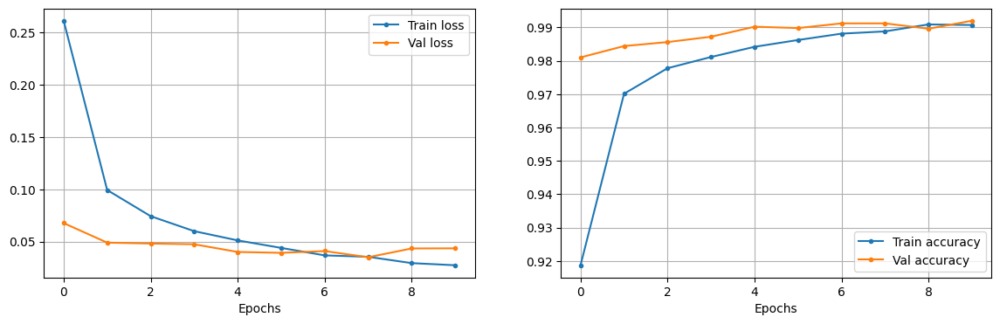

In [ ]:
history = model.fit(x_train, y_train, epochs=10, batch_size=32, validation_data=(x_val, y_val))
plots(history)

4. (OPCIONAL) Por que o uso de Dropout faz com que o desempenho de treinamento comece bastante inferior ao de validação?

#### Dicas
- Parta da arquitetura deste [tutorial](https://keras.io/examples/vision/mnist_convnet) (com os devidos ajustes feitos no item anterior) e adicione uma camada densa com um número suficiente de unidades. Lembre-se de (ao contrário do tutorial) trazer para dentro do modelo qualquer pré-processamento necessário.
- Visualize os gráficos do treinamento usando a função `plots` fornecida (ou a ferramenta TensorBoard).
- Ao usar camadas convolucionais com GPU, a execução paralelizada torna impossível garantir a reproducibilidade, portanto, não perca tempo com isso.

In [ ]:
import datetime

In [ ]:
%load_ext tensorboard

Epoch 1/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.9972 - loss: 0.0094 - val_accuracy: 0.9904 - val_loss: 0.0576
Epoch 2/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 12s 6ms/step - accuracy: 0.9970 - loss: 0.0098 - val_accuracy: 0.9900 - val_loss: 0.0590
Epoch 3/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.9972 - loss: 0.0090 - val_accuracy: 0.9912 - val_loss: 0.0546
Epoch 4/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - accuracy: 0.9971 - loss: 0.0091 - val_accuracy: 0.9914 - val_loss: 0.0580
Epoch 5/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - accuracy: 0.9973 - loss: 0.0095 - val_accuracy: 0.9908 - val_loss: 0.0560
Epoch 6/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - accuracy: 0.9971 - loss: 0.0089 - val_accuracy: 0.9894 - val_loss: 0.0590
Epoch 7/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.9977 - loss: 0.0081 - val_accuracy: 0.9896 - val_loss: 0.0621
Epoch 8/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - accuracy: 0.9972 - loss: 0.0

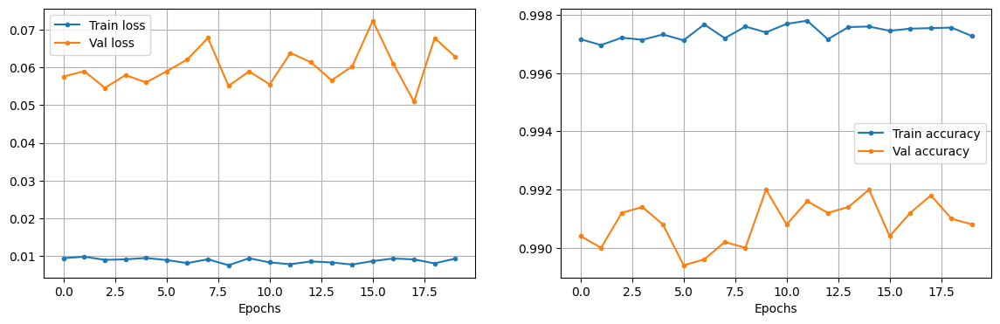

In [ ]:
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

history = model.fit(x_train, y_train, epochs=20, batch_size=32, validation_data=(x_val, y_val), callbacks=[tensorboard_callback])

plots(history)

In [ ]:
%tensorboard --logdir logs/fit

Reusing TensorBoard on port 6006 (pid 7958), started 0:00:40 ago. (Use '!kill 7958' to kill it.)

<IPython.core.display.Javascript object>

## (OPCIONAL) Fashion-MNIST

5. (OPCIONAL) Repita para o conjunto [Fashion-MNIST](https://github.com/zalandoresearch/fashion-mnist), o qual também está [disponível no Keras](https://keras.io/api/datasets/fashion_mnist). Nesse caso, é suficiente aproveitar a mesma arquitetura do modelo e apenas (se necessário) alterar a taxa de aprendizado e o número de épocas. Sem muito esforço é possível conseguir uma acurácia de validação de 92% (em comparação com 87% para uma rede densa). Se desejar, visualize algumas imagens do conjunto de treinamento e algumas predições erradas no conjunto de teste.

In [ ]:
from tensorflow.keras.datasets import fashion_mnist

(x_fashion_train, y_fashion_train), (x_fashion_test, y_fashion_test) = fashion_mnist.load_data()

print("Train:", x_fashion_train.shape, y_fashion_train.shape)
print("Test :", x_fashion_test.shape, y_fashion_test.shape)

Train: (60000, 28, 28) (60000,)
Test : (10000, 28, 28) (10000,)


In [ ]:
# Últimas 5.000 imagens para validação
x_fashion_val = x_fashion_train[55000:]
y_fashion_val = y_fashion_train[55000:]

x_fashion_train = x_fashion_train[:55000]
y_fashion_train = y_fashion_train[:55000]

print("Train:", x_fashion_train.shape, y_fashion_train.shape)
print("Val  :", x_fashion_val.shape, y_fashion_val.shape)
print("Test :", x_fashion_test.shape, y_fashion_test.shape)

Train: (55000, 28, 28) (55000,)
Val  : (5000, 28, 28) (5000,)
Test : (10000, 28, 28) (10000,)


In [ ]:
fashion_model = make_model()

fashion_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=keras.losses.SparseCategoricalCrossentropy(from_logits=False), metrics=["accuracy"])

fashion_model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_2 (Rescaling)         │ (None, 28, 28)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_2 (Reshape)             │ (None, 28, 28, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 26, 26, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 13, 13, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 11, 11, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 5, 5, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 3, 3, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 1, 1, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1, 1, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 110,474 (431.54 KB)

 Trainable params: 110,474 (431.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 16s 8ms/step - accuracy: 0.7598 - loss: 0.6556 - val_accuracy: 0.8348 - val_loss: 0.4412
Epoch 2/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - accuracy: 0.8345 - loss: 0.4492 - val_accuracy: 0.8544 - val_loss: 0.3848
Epoch 3/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8561 - loss: 0.3876 - val_accuracy: 0.8722 - val_loss: 0.3449
Epoch 4/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - accuracy: 0.8701 - loss: 0.3516 - val_accuracy: 0.8722 - val_loss: 0.3376
Epoch 5/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - accuracy: 0.8794 - loss: 0.3243 - val_accuracy: 0.8786 - val_loss: 0.3122
Epoch 6/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8881 - loss: 0.3037 - val_accuracy: 0.8886 - val_loss: 0.2899
Epoch 7/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8923 - loss: 0.2879 - val_accuracy: 0.8908 - val_loss: 0.2943
Epoch 8/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8989 - loss: 0.2729 

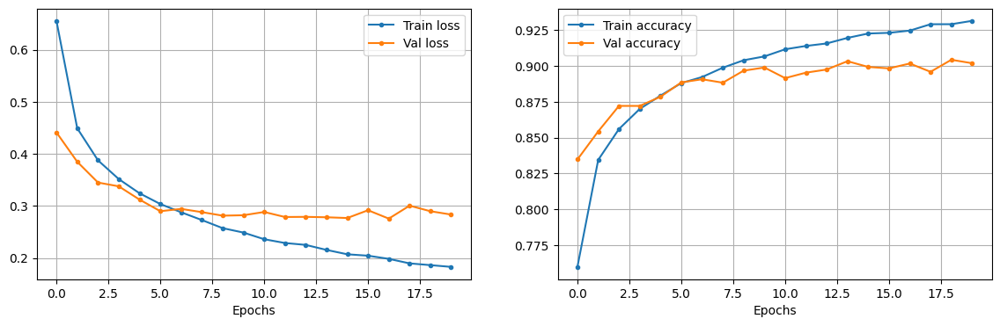

In [ ]:
fashion_history = fashion_model.fit(x_fashion_train, y_fashion_train, epochs=20, batch_size=32, validation_data=(x_fashion_val, y_fashion_val))

plots(fashion_history)

In [ ]:
fashion_test_loss, fashion_test_acc = fashion_model.evaluate(x_fashion_test, y_fashion_test, verbose=1)

print(f"Loss no teste: {fashion_test_loss:.4f}")
print(f"Acurácia no teste: {fashion_test_acc:.4f}")

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8983 - loss: 0.3088
Loss no teste: 0.3088
Acurácia no teste: 0.8983


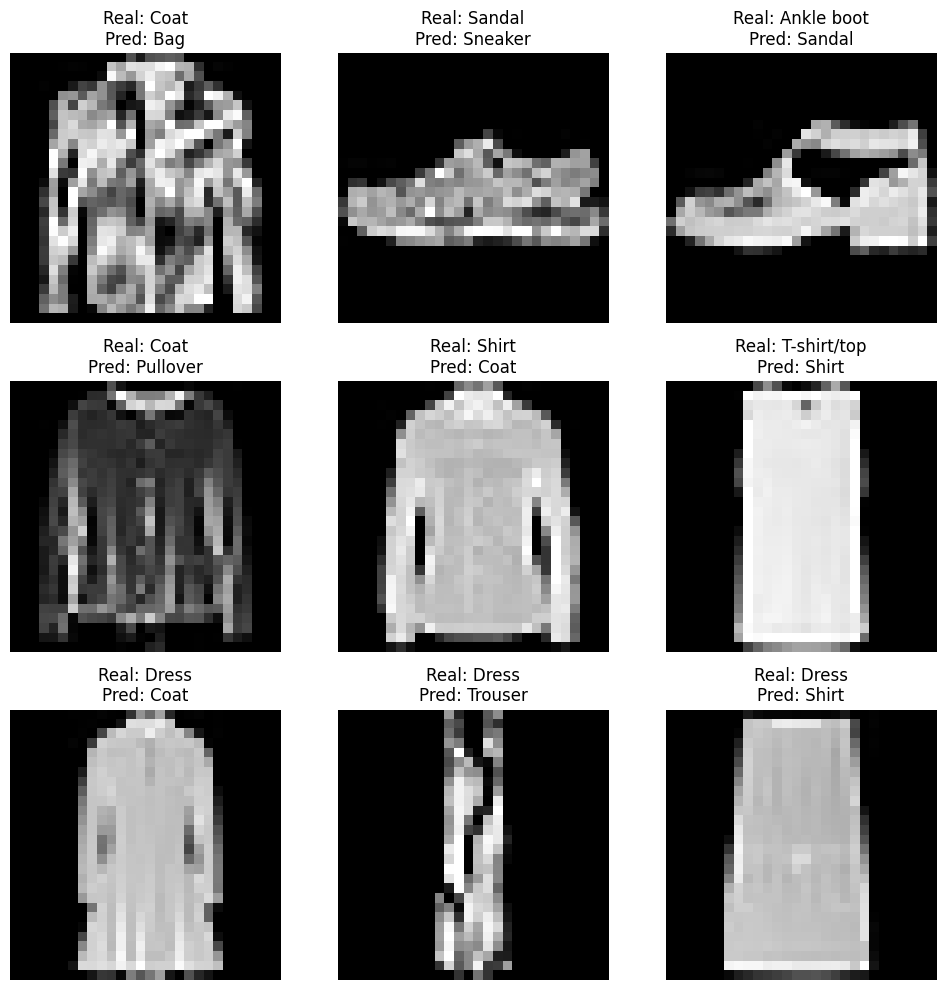

In [ ]:
# Visualização de algumas classificações incorretas
fashion_pred = fashion_model.predict(x_fashion_test, verbose=0)
fashion_pred_labels = np.argmax(fashion_pred, axis=1)

wrong = np.where(fashion_pred_labels != y_fashion_test)[0]

class_names = ["T-shirt/top", "Trouser", "Pullover", "Dress", "Coat",
               "Sandal", "Shirt", "Sneaker", "Bag", "Ankle boot"]

plt.figure(figsize=(10, 10))

for i, idx in enumerate(wrong[:9]):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(x_fashion_test[idx], cmap="gray")
    plt.title(f"Real: {class_names[y_fashion_test[idx]]}\n" f"Pred: {class_names[fashion_pred_labels[idx]]}")
    plt.axis("off")

plt.tight_layout()

## CIFAR-10 — carregamento externo pelo Google Drive

Nesta versão, o dataset não é baixado pelo Keras. O arquivo oficial é baixado externamente, enviado ao Google Drive e carregado pelo Colab.


In [ ]:
from google.colab import drive
drive.mount("/content/drive")

#uso de nomes em caps-lock é comum para indicar o uso de constante, conforme indicação do Michael Barr (https://barrgroup.com/embedded-c-coding-standard)
DRIVE_DATASET_DIR = "/content/drive/MyDrive/Datasets"
CIFAR_ARCHIVE = os.path.join(
    DRIVE_DATASET_DIR,
    "cifar-10-python.tar.gz"
)

CIFAR_EXTRACT_DIR = "/content/cifar-10-batches-py"

Mounted at /content/drive


In [ ]:
if not os.path.exists(CIFAR_ARCHIVE):
    raise FileNotFoundError(
        f"\nArquivo não encontrado:\n{CIFAR_ARCHIVE}\n\n"
        "Baixe externamente o arquivo cifar-10-python.tar.gz "
        "e coloque-o na pasta datasets do Google Drive."
    )

if not os.path.exists(CIFAR_EXTRACT_DIR):
    with tarfile.open(CIFAR_ARCHIVE, "r:gz") as tar:
        tar.extractall("/content")

def load_cifar_batch(path):
    with open(path, "rb") as f:
        batch = pickle.load(f, encoding="bytes")

    x = batch[b"data"].reshape(
        -1, 3, 32, 32
    ).transpose(0, 2, 3, 1)

    y = np.asarray(batch[b"labels"], dtype=np.int64)

    return x, y

x_parts = []
y_parts = []

for i in range(1, 6):
    x, y = load_cifar_batch(
        os.path.join(CIFAR_EXTRACT_DIR, f"data_batch_{i}")
    )
    x_parts.append(x)
    y_parts.append(y)

x_train = np.concatenate(x_parts, axis=0)
y_train = np.concatenate(y_parts, axis=0)

x_test, y_test = load_cifar_batch(
    os.path.join(CIFAR_EXTRACT_DIR, "test_batch")
)

print("x_train:", x_train.shape, x_train.dtype)
print("y_train:", y_train.shape, y_train.dtype)
print("x_test :", x_test.shape, x_test.dtype)
print("y_test :", y_test.shape, y_test.dtype)

/tmp/ipykernel_3935/3871569583.py:10: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall("/content")


x_train: (50000, 32, 32, 3) uint8
y_train: (50000,) int64
x_test : (10000, 32, 32, 3) uint8
y_test : (10000,) int64


Observe que o `shape` do array `y` precisa ser corrigido:
- Para usar a perda `sparse_categorical_crossentropy`, `y` precisa ser um tensor 1D com valores em `[0, 1, ..., n_classes-1]`
- Para usar a perda `categorical_crossentropy`, `y` precisa ser um tensor 2D com *shape* `(n_samples, n_classes)` e codificação *one-hot*


In [ ]:
# Os rótulos do CIFAR-10 são inteiros de 0 a 9
# Esse formato é adequado para SparseCategoricalCrossentropy
y_train = y_train.reshape(-1)
y_test = y_test.reshape(-1)

# Últimas 5.000 imagens do treinamento para validação
x_val = x_train[45000:]
y_val = y_train[45000:]

x_train = x_train[:45000]
y_train = y_train[:45000]

print("Train:", x_train.shape, y_train.shape)
print("Val  :", x_val.shape, y_val.shape)
print("Test :", x_test.shape, y_test.shape)

Train: (45000, 32, 32, 3) (45000,)
Val  : (5000, 32, 32, 3) (5000,)
Test : (10000, 32, 32, 3) (10000,)


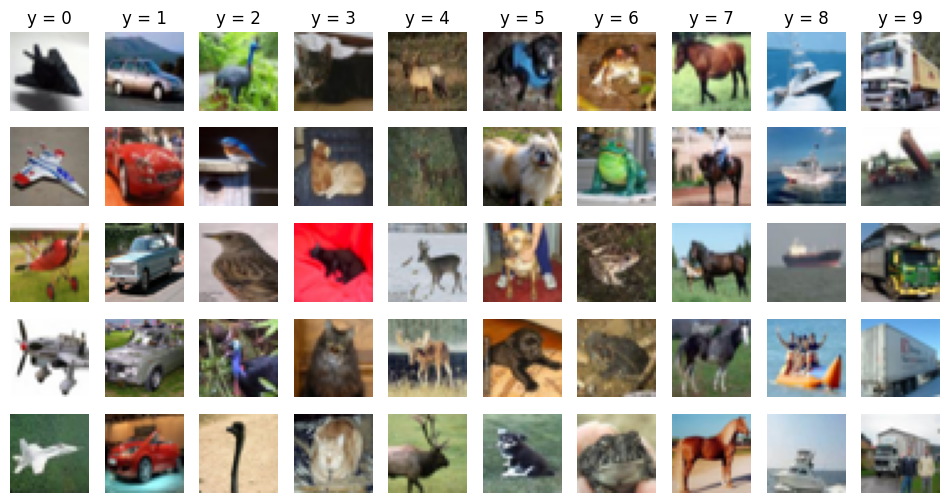

In [ ]:
plt.figure(figsize=(12,6))
for i in range(5):
  for c in range(10):
    plt.subplot(5, 10, 10*i+c+1)
    img = x_train[y_train == c][i]
    plt.imshow(img)
    if i == 0:
      plt.title('y = {}'.format(c))
    plt.axis('off')

In [ ]:
num_classes = 10

def make_model_CIFAR():
    model = keras.Sequential([
        keras.Input(shape=(32, 32, 3)),
        layers.Rescaling(1.0 / 255.0),

        layers.Conv2D(32, kernel_size=3, activation="relu"),
        layers.MaxPooling2D(pool_size=2),

        layers.Conv2D(64, kernel_size=3, activation="relu"),
        layers.MaxPooling2D(pool_size=2),

        layers.Conv2D(128, kernel_size=3, activation="relu"),
        layers.MaxPooling2D(pool_size=2),

        layers.Dropout(0.3),
        layers.Flatten(),
        layers.Dense(128, activation="relu"),
        layers.Dense(num_classes, activation="softmax"),
    ])

    return model

make_model_CIFAR().summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_3 (Rescaling)         │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 15, 15, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 13, 13, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 4, 4, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 2, 2, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 2, 2, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 160,202 (625.79 KB)

 Trainable params: 160,202 (625.79 KB)

 Non-trainable params: 0 (0.00 B)

6. Inicialmente, apenas converta a mesma arquitetura utilizada no MNIST para o formato das imagens do CIFAR-10 e treine o modelo. Note que agora não é mais necessário usar uma camada `Reshape`. Certifique-se de escolher um batch size e taxa de aprendizado apropriadas. Observe que é difícil obter uma acurácia de validação superior a 73%.

7. Por que você acha que isso acontece? Explique.

In [ ]:
model = make_model_CIFAR()

model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=keras.losses.SparseCategoricalCrossentropy(from_logits=False), metrics=["accuracy"])

In [ ]:
history = model.fit(x_train, y_train, epochs=20, batch_size=64, validation_data=(x_val, y_val))

Epoch 1/20
704/704 ━━━━━━━━━━━━━━━━━━━━ 12s 9ms/step - accuracy: 0.4164 - loss: 1.5953 - val_accuracy: 0.4990 - val_loss: 1.3447
Epoch 2/20
704/704 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.5513 - loss: 1.2538 - val_accuracy: 0.5968 - val_loss: 1.1326
Epoch 3/20
704/704 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6060 - loss: 1.1150 - val_accuracy: 0.6504 - val_loss: 1.0047
Epoch 4/20
704/704 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.6408 - loss: 1.0175 - val_accuracy: 0.6656 - val_loss: 0.9346
Epoch 5/20
704/704 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.6716 - loss: 0.9336 - val_accuracy: 0.6652 - val_loss: 0.9664
Epoch 6/20
704/704 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.6935 - loss: 0.8740 - val_accuracy: 0.6986 - val_loss: 0.8686
Epoch 7/20
704/704 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7092 - loss: 0.8278 - val_accuracy: 0.7110 - val_loss: 0.8291
Epoch 8/20
704/704 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.7266 - loss: 0.7825 - val_accuracy: 0

### Resposta
7. A acurácia de validação fica entorno de 75%, mesmo com 20 épocas, devido a ao rápido overffiting que o modelo está gerando, provavelmente pela rede não estar bem estruturada ou não profunda o suficiente para lidar com imagens pequenas e com muita infomarção espacial.

### Data augmentation
Para melhorar o desempenho, utilizaremos a técnica de aumento de dados (*data augmentation*). Há duas formas principais de utilizar esta técnica no Keras:
- Usando a função [`tf.keras.preprocessing.image.ImageDataGenerator`](https://keras.io/api/preprocessing/image/#imagedatagenerator-class), a qual opcionalmente permite aplicar transformações aleatórias. Esta é a abordagem mais tradicional.
- Usando camadas de *data augmentation* como parte do modelo, as quais aplicam transformações aleatórias *somente* durante o treinamento (ficando inativas fora do treinamento). Esta é uma abordagem mais recente e ainda experimental. A principal vantagem é tornar as operações mais rápidas pelo uso da GPU, conforme explicado [neste tutorial](https://keras.io/guides/preprocessing_layers/#preprocessing-data-before-the-model-or-inside-the-model) e também [neste](https://keras.io/examples/vision/image_classification_from_scratch/#two-options-to-preprocess-the-data).

Para acelerar o treinamento usaremos aqui a segunda abordagem. Um exemplo é mostrado abaixo; você pode adicionar outras transformações se desejar.



In [ ]:
from tensorflow.keras import Sequential


In [ ]:
data_augmentation = keras.Sequential([
    layers.RandomTranslation(height_factor=0.1, width_factor=0.1),
    layers.RandomFlip("horizontal"),
], name="data_augmentation")

print(data_augmentation)

<Sequential name=data_augmentation, built=False>


In [ ]:
def make_model_CIFAR_augmented():
    model = keras.Sequential([
        keras.Input(shape=(32, 32, 3)),
        data_augmentation,
        layers.Rescaling(1.0 / 255.0),

        layers.Conv2D(32, kernel_size=3, activation="relu"),
        layers.MaxPooling2D(pool_size=2),

        layers.Conv2D(64, kernel_size=3, activation="relu"),
        layers.MaxPooling2D(pool_size=2),

        layers.Conv2D(128, kernel_size=3, activation="relu"),
        layers.MaxPooling2D(pool_size=2),

        layers.Dropout(0.5),
        layers.Flatten(),
        layers.Dense(128, activation="relu"),
        layers.Dense(num_classes, activation="softmax"),
    ])

    return model

make_model_CIFAR_augmented().summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ data_augmentation (Sequential)  │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_6 (Rescaling)         │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_18 (MaxPooling2D) │ (None, 15, 15, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 13, 13, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_19 (MaxPooling2D) │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, 4, 4, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_20 (MaxPooling2D) │ (None, 2, 2, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 2, 2, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 160,202 (625.79 KB)

 Trainable params: 160,202 (625.79 KB)

 Non-trainable params: 0 (0.00 B)

**Obs:** Aparentemente há um bug ainda não resolvido nas camadas `RandomTranslation` e `RandomRotation`, conforme descrito [aqui](https://stackoverflow.com/questions/62339559/black-pixels-outside-the-border-when-using-keras-layers-experimental-preprocessi) e visualizado por exemplo [aqui](https://keras.io/examples/vision/image_classification_from_scratch/#using-image-data-augmentation), [aqui](https://keras.io/guides/transfer_learning/#using-random-data-augmentation) e nas imagens abaixo. (Não deveria haver bordas pretas nas imagens transformadas.) Felizmente esse defeito não afeta o desempenho de forma significativa.

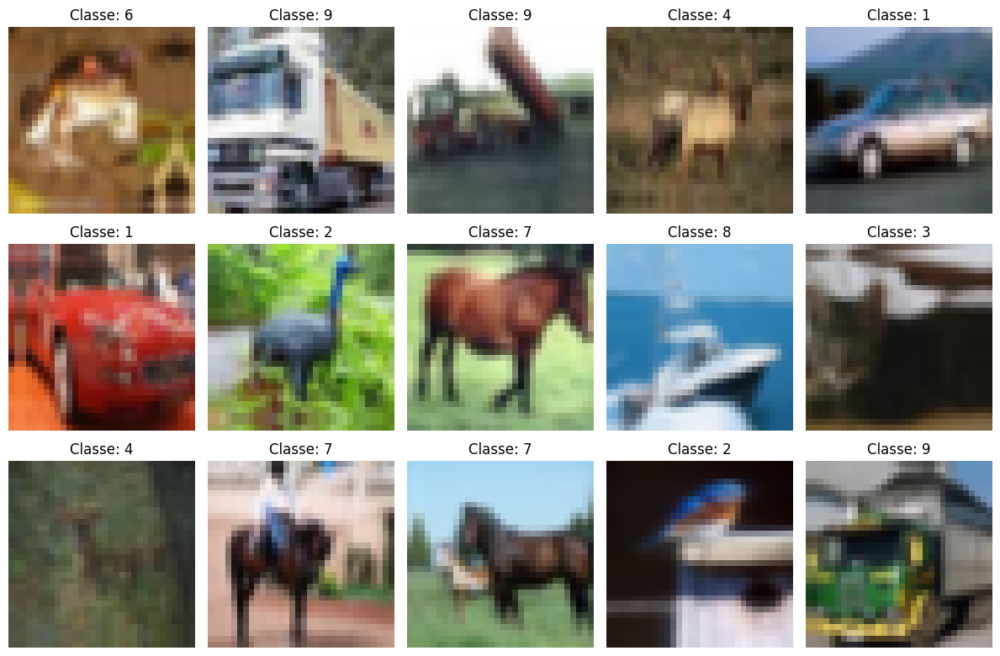

In [ ]:
plt.figure(figsize=(12, 8))

for j in range(15):
    i = j

    img = data_augmentation(
        x_train[i:i+1],
        training=True
    )[0].numpy()

    plt.subplot(3, 5, j + 1)
    plt.imshow(np.clip(img, 0, 255).astype("uint8"))
    plt.title(f"Classe: {y_train[i]}")
    plt.axis("off")

plt.tight_layout()

8. Treine o modelo até obter pelo menos 80% de acurácia de validação. Note que será preciso um número elevado de épocas (100 ou mais), o que deve levar vários minutos.

#### Dicas
- Certifique-se de usar uma taxa de aprendizado apropriada ao longo de todo o treinamento. Por exemplo:
  - Treine por N épocas com taxa constante, observe os resultados, depois continue o treinamento por mais N épocas, etc. Se em algum ponto o desempenho não estiver melhorando, reduza manualmente a taxa de aprendizado;
  - Utilize uma *callback* de decaimento, como [`ReduceLROnPlateau`](https://keras.io/api/callbacks/reduce_lr_on_plateau/) ou a genérica [`LearningRateScheduler`](https://keras.io/api/callbacks/learning_rate_scheduler/); ou
  - Utilize um valor pequeno constante e tenha bastante paciência.
  -  Fique à vontade para aprimorar o modelo se desejar. Para facilitar, você pode se basear em quaisquer outras referências ou tutoriais disponíveis, como por exemplo: [Tutorial 1](https://www.learnopencv.com/image-classification-using-convolutional-neural-networks-in-keras) ou [Tutorial 2](https://machinelearningmastery.com/how-to-develop-a-cnn-from-scratch-for-cifar-10-photo-classification). Note que alguns tutoriais estão desatualizados; por exemplo, a função `fit_generator` tornou-se obsoleta, tendo sido incorporada à função `fit`. No entanto, esteja ciente de que não é necessário um modelo muito complexo para obter a acurácia desejada.

In [ ]:
model = make_model_CIFAR_augmented()

model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.002), loss=keras.losses.SparseCategoricalCrossentropy(from_logits=False), metrics=["accuracy"])

In [ ]:
history = model.fit(x_train, y_train, epochs=25, batch_size=32, validation_data=(x_val, y_val))

Epoch 1/25
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - accuracy: 0.6219 - loss: 1.0755 - val_accuracy: 0.6862 - val_loss: 0.9094
Epoch 2/25
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - accuracy: 0.6217 - loss: 1.0752 - val_accuracy: 0.6938 - val_loss: 0.8770
Epoch 3/25
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - accuracy: 0.6230 - loss: 1.0724 - val_accuracy: 0.6704 - val_loss: 0.9191
Epoch 4/25
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - accuracy: 0.6215 - loss: 1.0730 - val_accuracy: 0.6696 - val_loss: 0.9391
Epoch 5/25
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - accuracy: 0.6253 - loss: 1.0655 - val_accuracy: 0.6738 - val_loss: 0.9325
Epoch 6/25
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - accuracy: 0.6276 - loss: 1.0612 - val_accuracy: 0.6948 - val_loss: 0.8877
Epoch 7/25
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - accuracy: 0.6293 - loss: 1.0538 - val_accuracy: 0.6758 - val_loss: 0.9241
Epoch 8/25
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - accuracy: 0.6321 - loss: 1

# 2. Usando uma rede pré-treinada (*transfer learning & fine-tuning*)

Nesta versão, o conjunto Cats vs Dogs também é baixado externamente e carregado a partir de um arquivo ZIP armazenado no Google Drive.


### Primeiro Dataset

In [ ]:
DRIVE_DATASET_DIR = "/content/drive/MyDrive/Datasets" #/content/drive/MyDrive/Datasets/kagglecatsanddogs_5340.zip

CATS_DOGS_ZIP = os.path.join(
    DRIVE_DATASET_DIR,
    "kagglecatsanddogs_5340.zip"
)

CATS_DOGS_ROOT = "/content/PetImages"

In [ ]:
if not os.path.exists(CATS_DOGS_ZIP):
    raise FileNotFoundError(
        f"\nArquivo não encontrado:\n{CATS_DOGS_ZIP}\n\n"
        "Baixe externamente o ZIP do Cats vs Dogs "
        "e coloque-o na pasta datasets do Google Drive."
    )

if not os.path.exists(CATS_DOGS_ROOT):
    with zipfile.ZipFile(CATS_DOGS_ZIP, "r") as zip_ref:
        zip_ref.extractall("/content")

print("Dataset:", CATS_DOGS_ROOT)
print("Cats:", len(os.listdir(os.path.join(CATS_DOGS_ROOT, "Cat"))))
print("Dogs:", len(os.listdir(os.path.join(CATS_DOGS_ROOT, "Dog"))))

Dataset: /content/PetImages
Cats: 12501
Dogs: 12501


In [ ]:
print("Arquivos em PetImages:")
print("Cat:", len(os.listdir("/content/PetImages/Cat")))
print("Dog:", len(os.listdir("/content/PetImages/Dog")))

Arquivos em PetImages:
Cat: 11742
Dog: 11670


In [ ]:
# Remove arquivos que não podem ser identificados como imagens JPEG (importante para não dar problema entre padrões de dados)
num_skipped = 0

for folder_name in ("Cat", "Dog"):
    folder_path = os.path.join(
        CATS_DOGS_ROOT,
        folder_name
    )

    for fname in os.listdir(folder_path):
        fpath = os.path.join(folder_path, fname)

        if not os.path.isfile(fpath):
            continue

        try:
            with open(fpath, "rb") as f:
                is_jfif = tf.compat.as_bytes("JFIF") in f.peek(10)
        except Exception:
            is_jfif = False

        if not is_jfif:
            num_skipped += 1
            os.remove(fpath)

print(f"Arquivos inválidos removidos: {num_skipped}")

Arquivos inválidos removidos: 1590


In [ ]:
image_size = (150, 150)
batch_size = 32
seed = 1337

train_ds = tf.keras.utils.image_dataset_from_directory(
    "/content/PetImages",
    validation_split=0.2,
    subset="training",
    seed=seed,
    image_size=image_size,
    batch_size=batch_size,
    label_mode="binary",
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    "/content/PetImages",
    validation_split=0.2,
    subset="validation",
    seed=seed,
    image_size=image_size,
    batch_size=batch_size,
    label_mode="binary",
)

print("Classes:", train_ds.class_names)

Found 23410 files belonging to 2 classes.
Using 18728 files for training.
Found 23410 files belonging to 2 classes.
Using 4682 files for validation.
Classes: ['Cat', 'Dog']


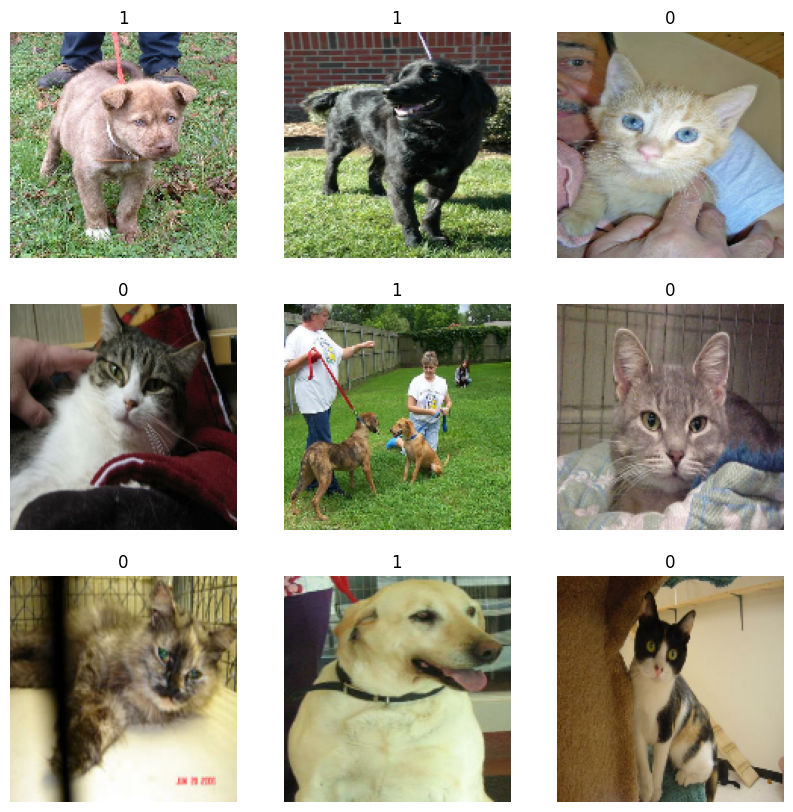

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(int(labels[i]))
        plt.axis("off")


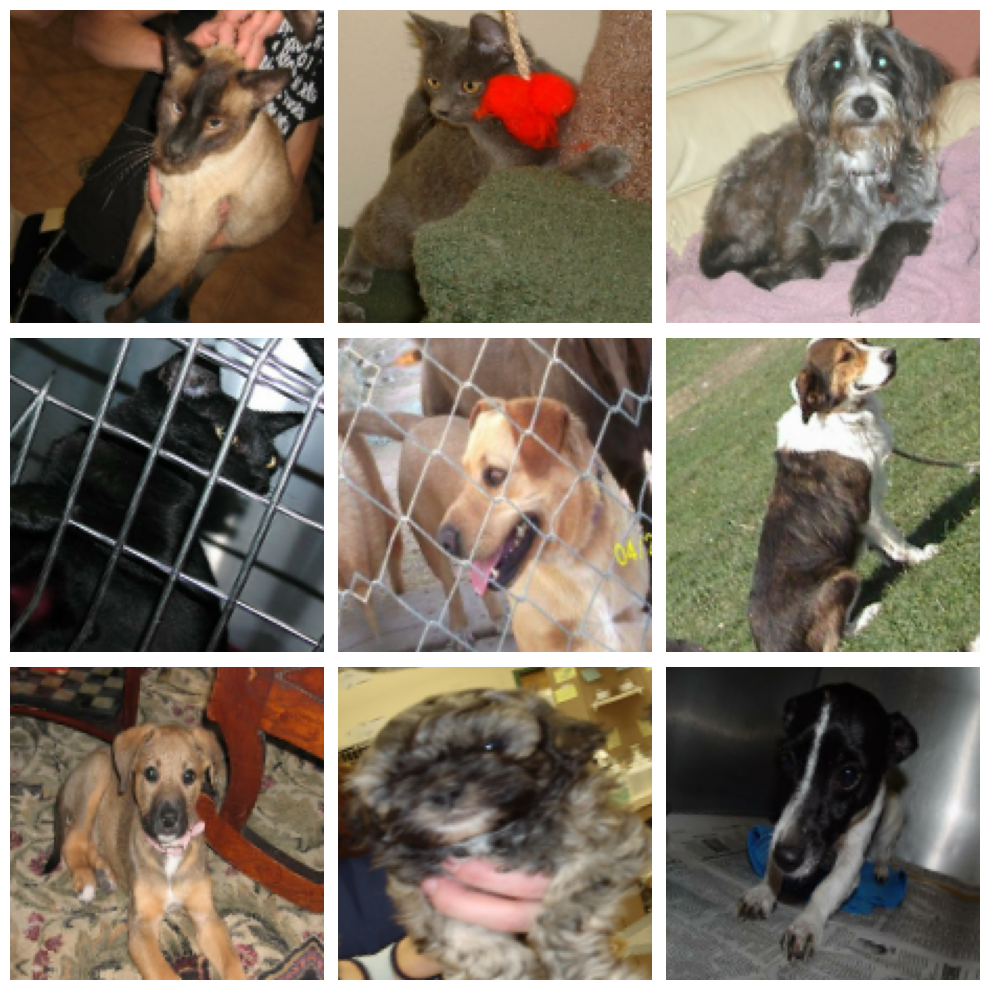

In [ ]:
data_augmentation = keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
], name="data_augmentation")

plt.figure(figsize=(10, 10))

for images, _ in train_ds.take(1):
    for i in range(min(9, images.shape[0])):
        ax = plt.subplot(3, 3, i + 1)

        augmented_image = data_augmentation(
            tf.expand_dims(images[i], 0),
            training=True
        )[0]

        plt.imshow(
            tf.cast(
                tf.clip_by_value(
                    augmented_image, 0, 255
                ),
                tf.uint8
            )
        )

        plt.axis("off")

plt.tight_layout()

In [ ]:
train_ds = train_ds.prefetch(buffer_size=32)
val_ds = val_ds.prefetch(buffer_size=32)

### Conjunto Cats vs Dogs — divisão treino/validação/teste

Nesta alternativa, o dataset é baixado externamente, armazenado no Google Drive
e carregado localmente no Colab. A divisão abaixo cria aproximadamente 70% para
treinamento, 15% para validação e 15% para teste, usando uma única semente.

In [ ]:
image_size = (150, 150)
batch_size = 32
seed = 1337

# 70% treinamento e 30% temporário.
train_ds = tf.keras.utils.image_dataset_from_directory(
    CATS_DOGS_ROOT,
    validation_split=0.30,
    subset="training",
    seed=seed,
    image_size=image_size,
    batch_size=batch_size,
    label_mode="binary",
    shuffle=True,
)

temp_ds = tf.keras.utils.image_dataset_from_directory(
    CATS_DOGS_ROOT,
    validation_split=0.30,
    subset="validation",
    seed=seed,
    image_size=image_size,
    batch_size=batch_size,
    label_mode="binary",
    shuffle=False,
)

# Aproximadamente 15% validação + 15% teste.
temp_batches = tf.data.experimental.cardinality(temp_ds).numpy()
val_batches = temp_batches // 2

validation_ds = temp_ds.take(val_batches)
test_ds = temp_ds.skip(val_batches)

print("Classes:", train_ds.class_names)
print("Batches de treino:", tf.data.experimental.cardinality(train_ds).numpy())
print("Batches de validação:", tf.data.experimental.cardinality(validation_ds).numpy())
print("Batches de teste:", tf.data.experimental.cardinality(test_ds).numpy())

Found 23410 files belonging to 2 classes.
Using 16387 files for training.
Found 23410 files belonging to 2 classes.
Using 7023 files for validation.
Classes: ['Cat', 'Dog']
Batches de treino: 513
Batches de validação: 110
Batches de teste: 110


/tmp/ipykernel_3935/1234460839.py:11: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  label = int(labels[i].numpy())


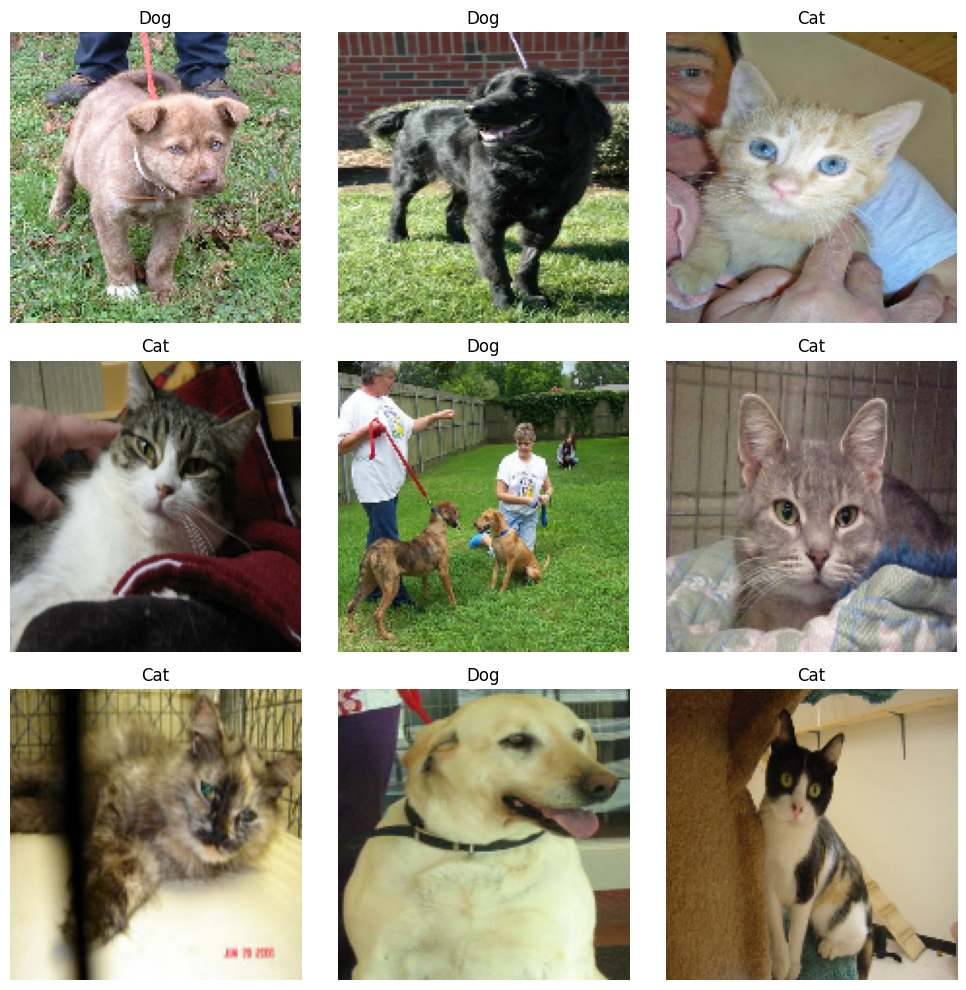

In [ ]:
plt.figure(figsize=(10, 10))

for images, labels in train_ds.take(1):
    for i in range(min(9, images.shape[0])):
        ax = plt.subplot(3, 3, i + 1)

        plt.imshow(images[i].numpy().astype("uint8"))

        label = int(labels[i].numpy())
        plt.title("Cat" if label == 0 else "Dog")
        plt.axis("off")

plt.tight_layout()

In [ ]:
# Prefetch melhora o fluxo de dados durante o treinamento.
# O cache em memória é evitado para não consumir muita RAM.
train_ds = train_ds.prefetch(tf.data.AUTOTUNE)
validation_ds = validation_ds.prefetch(tf.data.AUTOTUNE)
test_ds = test_ds.prefetch(tf.data.AUTOTUNE)

(150, 150, 3)


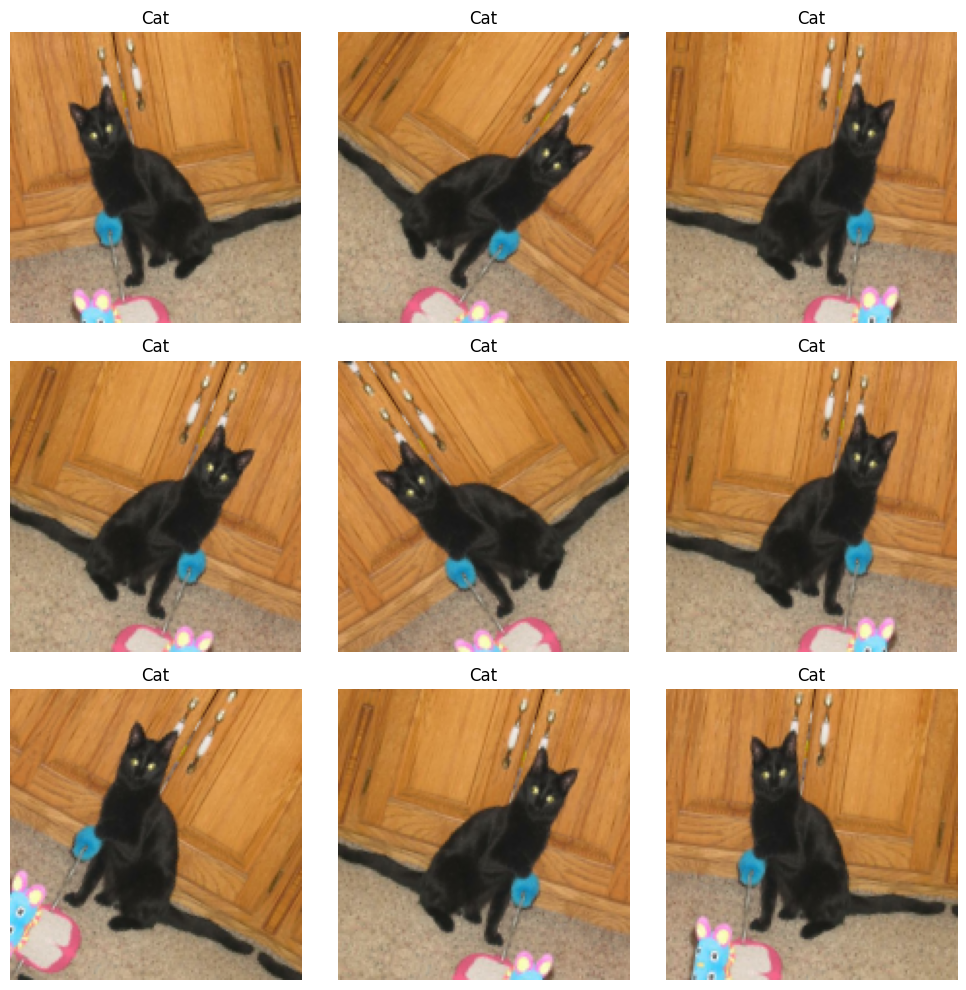

In [ ]:
for images, labels in train_ds.take(1):
    plt.figure(figsize=(10, 10))
    first_image = images[0]
    print(first_image.shape)

    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        augmented_image = data_augmentation(tf.expand_dims(first_image, 0), training=True)
        plt.imshow(tf.cast(augmented_image[0], tf.uint8))
        plt.title("Cat" if int(labels[0]) == 0 else "Dog")
        plt.axis("off")

    plt.tight_layout()

### Modelo

In [ ]:
from tensorflow.keras.applications.resnet_v2 import (
    ResNet50V2,
    preprocess_input
)

base_model = ResNet50V2(include_top=False, weights="imagenet", input_shape=(150, 150, 3), pooling="avg")

# Primeira etapa: somente a nova camada classificadora será treinada
base_model.trainable = False

inputs = keras.Input(shape=(150, 150, 3))

x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)

x = layers.Dropout(0.2)(x)

# Uma saída linear + BinaryCrossentropy(from_logits=True)
outputs = layers.Dense(1)(x)

model = keras.Model(inputs, outputs)

model.summary()

Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_14 (InputLayer)     │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_1 (TrueDivide)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_1 (Subtract)           │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50v2 (Functional)         │ (None, 2048)           │    23,564,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 1)              │         2,049 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,566,849 (89.90 MB)

 Trainable params: 2,049 (8.00 KB)

 Non-trainable params: 23,564,800 (89.89 MB)

In [ ]:
model.compile(optimizer=keras.optimizers.Adam(0.002), loss=keras.losses.BinaryCrossentropy(from_logits=True), metrics=["accuracy"])

epochs = 10
model.fit(train_ds, epochs=epochs, validation_data=validation_ds)

Epoch 1/10
513/513 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - accuracy: 0.9345 - loss: 0.1759 - val_accuracy: 0.9642 - val_loss: 0.0834
Epoch 2/10
513/513 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.9458 - loss: 0.1439 - val_accuracy: 0.9616 - val_loss: 0.0948
Epoch 3/10
513/513 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.9470 - loss: 0.1445 - val_accuracy: 0.9730 - val_loss: 0.0606
Epoch 4/10
513/513 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.9476 - loss: 0.1397 - val_accuracy: 0.9756 - val_loss: 0.0547
Epoch 5/10
513/513 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.9498 - loss: 0.1416 - val_accuracy: 0.9761 - val_loss: 0.0482
Epoch 6/10
513/513 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.9509 - loss: 0.1453 - val_accuracy: 0.9662 - val_loss: 0.0719
Epoch 7/10
513/513 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.9509 - loss: 0.1375 - val_accuracy: 0.9773 - val_loss: 0.0488
Epoch 8/10
513/513 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.9495 - loss: 0.1463 - 

Epoch 1/10
513/513 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.9517 - loss: 0.1344 - val_accuracy: 0.9824 - val_loss: 0.0355
Epoch 2/10
513/513 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.9479 - loss: 0.1461 - val_accuracy: 0.9588 - val_loss: 0.1041
Epoch 3/10
513/513 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - accuracy: 0.9524 - loss: 0.1390 - val_accuracy: 0.9872 - val_loss: 0.0264
Epoch 4/10
513/513 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.9494 - loss: 0.1463 - val_accuracy: 0.9676 - val_loss: 0.0753
Epoch 5/10
513/513 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.9494 - loss: 0.1461 - val_accuracy: 0.9707 - val_loss: 0.0711
Epoch 6/10
513/513 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - accuracy: 0.9509 - loss: 0.1506 - val_accuracy: 0.9747 - val_loss: 0.0552
Epoch 7/10
513/513 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - accuracy: 0.9526 - loss: 0.1388 - val_accuracy: 0.9619 - val_loss: 0.1080
Epoch 8/10
513/513 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - accuracy: 0.9517 - loss: 0.1420 - 

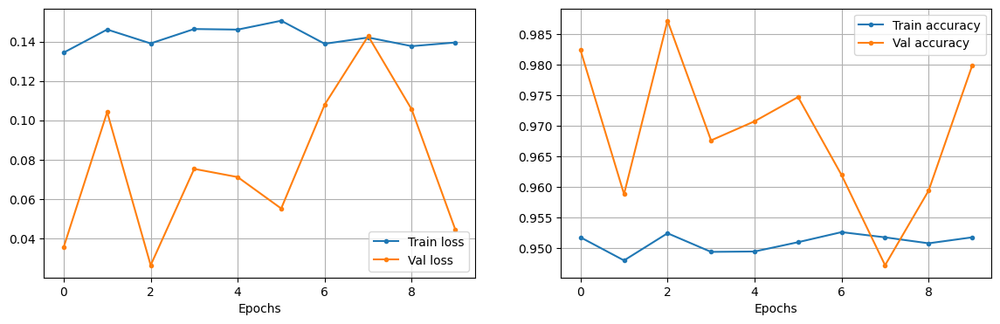

In [ ]:
history_transfer = model.fit(train_ds, epochs=10, validation_data=validation_ds)

plots(history_transfer)

## Fine-Tuning

Depois do treinamento inicial, algumas das últimas camadas da ResNet50V2
são liberadas para um ajuste fino com uma taxa de aprendizado pequena.

Epoch 1/5
513/513 ━━━━━━━━━━━━━━━━━━━━ 100s 159ms/step - accuracy: 0.9733 - loss: 0.0677 - val_accuracy: 0.9895 - val_loss: 0.0220
Epoch 2/5
513/513 ━━━━━━━━━━━━━━━━━━━━ 81s 157ms/step - accuracy: 0.9774 - loss: 0.0579 - val_accuracy: 0.9884 - val_loss: 0.0284
Epoch 3/5
513/513 ━━━━━━━━━━━━━━━━━━━━ 80s 157ms/step - accuracy: 0.9807 - loss: 0.0499 - val_accuracy: 0.9884 - val_loss: 0.0255
Epoch 4/5
513/513 ━━━━━━━━━━━━━━━━━━━━ 80s 155ms/step - accuracy: 0.9813 - loss: 0.0465 - val_accuracy: 0.9906 - val_loss: 0.0201
Epoch 5/5
513/513 ━━━━━━━━━━━━━━━━━━━━ 80s 156ms/step - accuracy: 0.9871 - loss: 0.0343 - val_accuracy: 0.9920 - val_loss: 0.0204


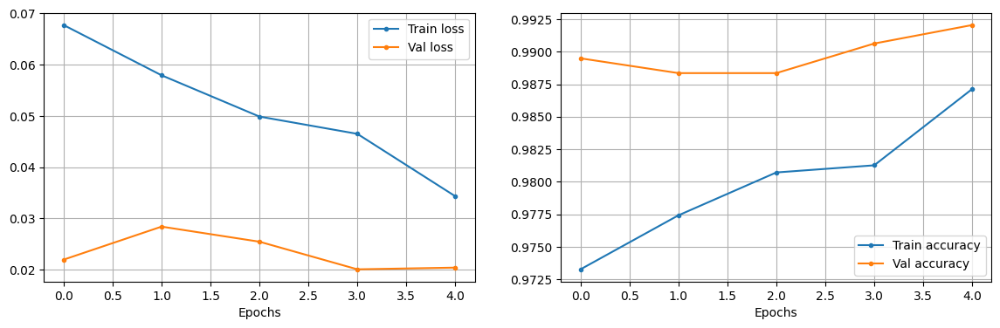

In [ ]:
# Libera a rede pré-treinada para fine-tuning
base_model.trainable = True

# Mantém as primeiras camadas congeladas
fine_tune_at = 100

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

print("Total de layers:", len(base_model.layers))

print("Layers congeladas:",
      sum(not layer.trainable for layer in base_model.layers))

print("Layers treináveis:",
      sum(layer.trainable for layer in base_model.layers))

model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-5), loss=keras.losses.BinaryCrossentropy(from_logits=True), metrics=["accuracy"])

fine_tune_epochs = 5

history_fine = model.fit(train_ds, epochs=fine_tune_epochs, validation_data=validation_ds)

plots(history_fine)

In [ ]:
# Avaliação final no conjunto de teste
test_loss, test_acc = model.evaluate(test_ds, verbose=1)
print(f"Acurácia no teste: {test_acc:.4f}")


110/110 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.9917 - loss: 0.0186
Acurácia no teste: 0.9917


# 3. (OPCIONAL) Visualizando os padrões aprendidos

1. (OPCIONAL) Para alguma rede convolucional à sua escolha, visualize o que cada camada da rede "aprendeu"; mais precisamente, mostre exemplos de imagens de entrada que maximizam a ativação dos filtros em cada camada. Para isso, siga este [tutorial](https://keras.io/examples/vision/visualizing_what_convnets_learn/).

A visualização será feita em duas partes:
- filtros da primeira camada convolucional
- mapas de ativação de uma imagem de entrada

Os filtros da primeira camada permitem observar padrões locais aprendidos,
enquanto os mapas de ativação mostram onde esses filtros respondem na imagem

## 3.1 Visualizando os filtros da primeira camada convolucional

A primeira camada convolucional da CNN possui filtros pequenos. Em imagens
em tons de cinza, cada filtro possui apenas um canal de entrada.

In [ ]:
# Seleciona a primeira camada Conv2D da CNN do MNIST.
conv_layers = [
    layer for layer in model.layers
    if isinstance(layer, layers.Conv2D)
]

first_conv = conv_layers[0]
filters, biases = first_conv.get_weights()

print("Camada:", first_conv.name)
print("Shape dos filtros:", filters.shape)
print("Número de filtros:", filters.shape[-1])

Camada: conv1
Shape dos filtros: (3, 3, 1, 32)
Número de filtros: 32


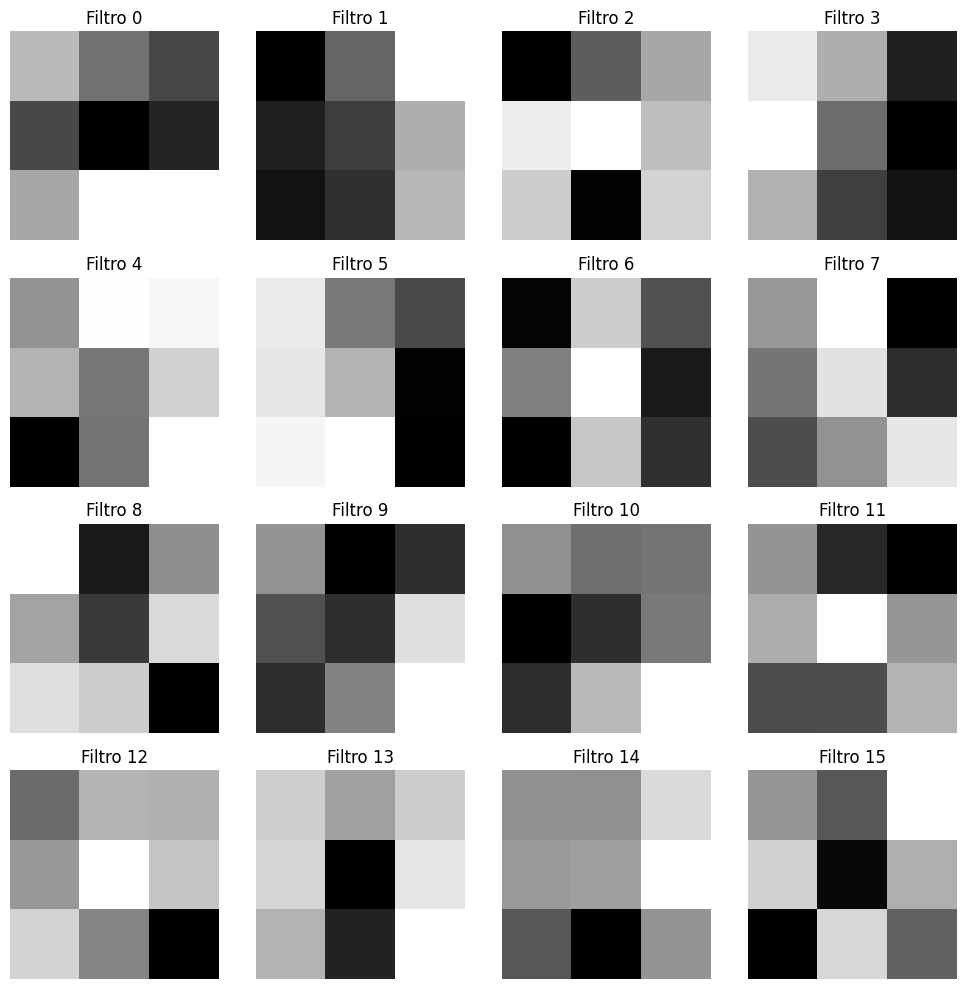

In [ ]:
# Visualiza até 16 filtros da primeira camada.
num_filters = min(16, filters.shape[-1])

plt.figure(figsize=(10, 10))

for i in range(num_filters):
    ax = plt.subplot(4, 4, i + 1)

    filter_img = filters[:, :, 0, i]

    # Normalização apenas para facilitar a visualização.
    vmin = filter_img.min()
    vmax = filter_img.max()

    if vmax > vmin:
        filter_img = (filter_img - vmin) / (vmax - vmin)

    plt.imshow(filter_img, cmap="gray")
    plt.title(f"Filtro {i}")
    plt.axis("off")

plt.tight_layout()

## 3.2 Mapas de ativação

Vamos observar a resposta de uma camada convolucional para uma imagem
específica do conjunto de teste. Os filtros representam parâmetros aprendidos pela primeira camada convolucional. Os mapas de ativação mostram a resposta desses filtros para uma determinada imagem.

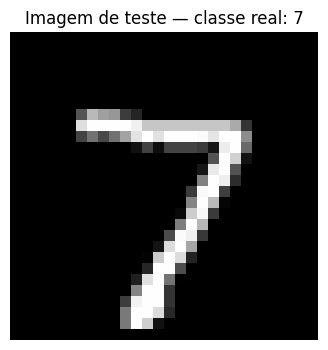

In [ ]:
# Escolhe uma imagem do conjunto de teste.
image_index = 0
sample = x_test[image_index:image_index + 1]

plt.figure(figsize=(4, 4))
plt.imshow(x_test[image_index], cmap="gray")
plt.title(f"Imagem de teste — classe real: {y_test[image_index]}")
plt.axis("off")
plt.show()

In [ ]:
# Modelo intermediário para obter a saída da primeira Conv2D
input_layer = keras.Input(shape=(28, 28))
x = input_layer

for layer in model.layers:
    x = layer(x)
    if layer == first_conv:
        break

activation_model = keras.Model(inputs=input_layer, outputs=x)

activations = activation_model.predict(sample, verbose=0)

print("Shape das ativações:", activations.shape)

Shape das ativações: (1, 26, 26, 32)


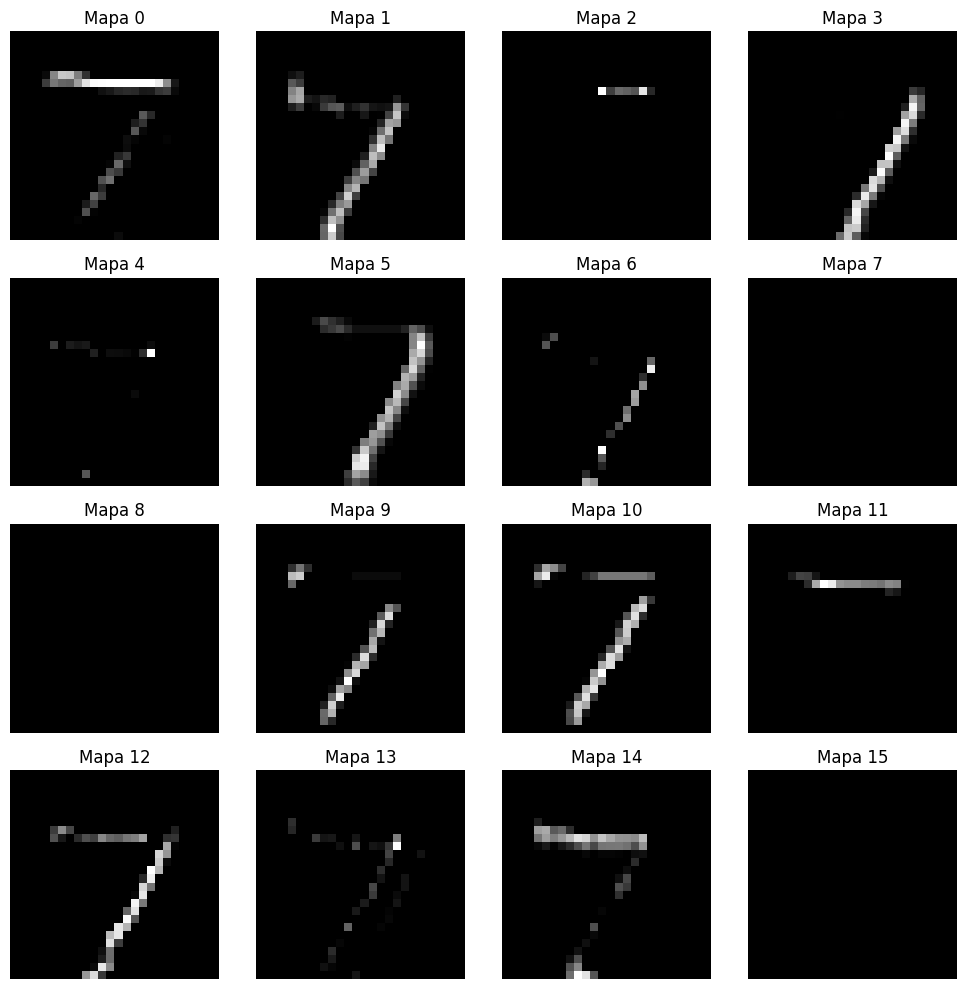

In [ ]:
num_activations = min(16, activations.shape[-1])

plt.figure(figsize=(10, 10))

for i in range(num_activations):
    ax = plt.subplot(4, 4, i + 1)
    plt.imshow(activations[0, :, :, i], cmap="gray")
    plt.title(f"Mapa {i}")
    plt.axis("off")

plt.tight_layout()